<hr><h1> The problem of fake news classification: A comparison between
 prediction models and the analysis of online found datasets </hr>
 <h3> Federico Boni </h3>
 <hr>
The following Jupyter notebook provide the Python code of the project. Given the large amount of code, it was decided to divide it into modules. Hence, in addition to this notebook, the following modules have been created:

- <b>lstm.py</b> : Contain python class for manage the Lstm model
- <b>lstm_word2vec.py</b>: Contains python class for manage the Lstm model with Word2vec embedding
- <b>model_bert.py</b>: Contains python class for manage the Bert model
- <b>datasets.py</b>: Contains python class for manage datasets

<hr>



The complete list of the dependencies of the project can be found in the <i>requirements.txt</i> file. Each of the module specified in that file can be installed with pip. Let's import all the dependencies used:

In [1]:
from datasets import  Dataset;
from model_bert import RobertaFineModel;
from lstm import Lstm;
from lstm_word2vec import LstmWord2Vec;


from statsmodels.stats.contingency_tables import mcnemar
from tensorflow import keras;


import matplotlib.pyplot as plt
import numpy as np
import os;
import pandas as pd;


## ❍ Dataset Analysis
<hr>
This chapter regard only the datasets. The code of the analyses in section 2 (Datasets) and section 7 (In depth data analysis) of the report can be found here.
<hr>

Using Dataset class, all datasets are imported, each one divided in fake news and trustworhty articles:

In [2]:
dataset_0_fake=Dataset(0).drop_empty_rows().filter(only_fake=True);
dataset_0_real=Dataset(0).drop_empty_rows().filter(only_real=True);

dataset_1_fake=Dataset(1).drop_empty_rows().filter(only_fake=True);
dataset_1_real=Dataset(1).drop_empty_rows().filter(only_real=True);

dataset_2_fake=Dataset(2).drop_empty_rows().filter(only_fake=True);
dataset_2_real=Dataset(2).drop_empty_rows().filter(only_real=True);


First of all, the number of articles in each dataset is computed:

In [3]:
dataset_0_size= [len(dataset_0_fake.get().index),len(dataset_0_real.get().index)];
dataset_1_size= [len(dataset_1_fake.get().index),len(dataset_1_real.get().index)];
dataset_2_size= [len(dataset_2_fake.get().index),len(dataset_2_real.get().index)];

print ("Dataset 0 has a total of " +str(sum(dataset_0_size))+ " articles ("+str(dataset_0_size[0])+ " fake, "+ str(dataset_0_size[1])+" real).");
print ("Dataset 1 has a total of " +str(sum(dataset_1_size))+ " articles ("+str(dataset_1_size[0])+ " fake, "+ str(dataset_1_size[1])+" real).");
print ("Dataset 2 has a total of " +str(sum(dataset_2_size))+ " articles ("+str(dataset_2_size[0])+ " fake, "+ str(dataset_2_size[1])+" real).");

Dataset 0 has a total of 38646 articles (17455 fake, 21191 real).
Dataset 1 has a total of 24802 articles (12088 fake, 12714 real).
Dataset 2 has a total of 2863 articles (1193 fake, 1670 real).


Now the number of empty rows in each dataset is found:

In [4]:
empty_rows=[len(Dataset(0).get().index)-len(Dataset(0).drop_empty_rows().get().index),
            len(Dataset(1).get().index)-len(Dataset(1).drop_empty_rows().get().index),
            len(Dataset(2).get().index)-len(Dataset(2).drop_empty_rows().get().index)];

print(empty_rows);

[0, 631, 1]


Finally, the number of duplicates for each dataset:

In [5]:
dup=[len(Dataset(0,drop_dup=False).drop_empty_rows().get().index)-len(Dataset(0).drop_empty_rows().get().index),
     len(Dataset(1,drop_dup=False).drop_empty_rows().get().index)-len(Dataset(1).drop_empty_rows().get().index),
     len(Dataset(2,drop_dup=False).drop_empty_rows().get().index)-len(Dataset(2).drop_empty_rows().get().index),];
print("Number of duplicates for each dataset:")
print(dup)

Number of duplicates for each dataset:
[6252, 472, 1125]


... and the number of duplicates across the 3 datasets:

In [6]:
ds_tot=Dataset(0).append(1).append(2).drop_empty_rows();
sum_of_lengths=sum(dataset_0_size)+sum(dataset_1_size)+sum(dataset_2_size);
unique_lenght=len(ds_tot.get().index);
print("Number of duplicates across datasets: " + str(sum_of_lengths-unique_lenght))


Number of duplicates across datasets: 0


Now let's get the average length of their articles:

In [7]:

dataset_0_length= [dataset_0_fake.avg_length_of_text(),dataset_0_real.avg_length_of_text()];
dataset_1_length= [dataset_1_fake.avg_length_of_text(),dataset_1_real.avg_length_of_text()];
dataset_2_length= [dataset_2_fake.avg_length_of_text(),dataset_2_real.avg_length_of_text()];

print ("Dataset 0 has an average article length of " +str(sum(dataset_0_length)/2)+ " articles ("+str(dataset_0_length[0])+ " fake, "+ str(dataset_0_length[1])+" real).");
print ("Dataset 1 has an average article length of " +str(sum(dataset_1_length)/2)+ " articles ("+str(dataset_1_length[0])+ " fake, "+ str(dataset_1_length[1])+" real).");
print ("Dataset 2 has an average article length of " +str(sum(dataset_2_length)/2)+ " articles ("+str(dataset_2_length[0])+ " fake, "+ str(dataset_2_length[1])+" real).");


Dataset 0 has an average article length of 417.178572985313 articles (439.57502148381553 fake, 394.78212448681046 real).
Dataset 1 has an average article length of 795.8470817265593 articles (614.7150066181337 fake, 976.979156834985 real).
Dataset 2 has an average article length of 591.2191631824364 articles (556.9748533109807 fake, 625.4634730538922 real).


... and plot these lengths:

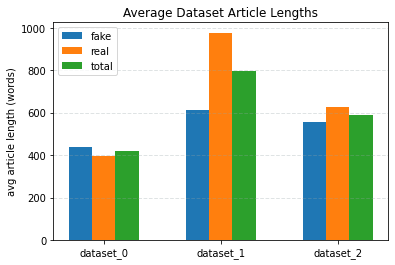

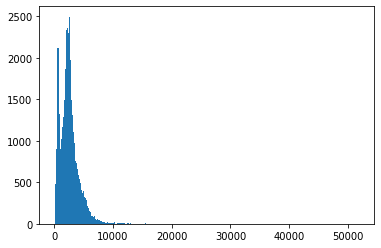

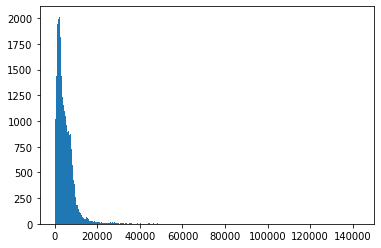

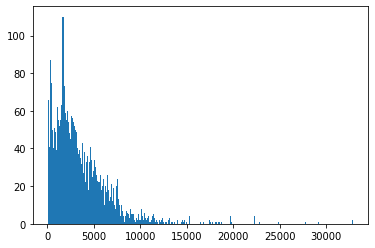

In [8]:
#Comparison between datasets:
width=0.2
plt.grid(color='#95a5a6', linestyle='--', linewidth=1, axis='y', alpha=0.3);
["fake_len","real_len"]
plt.bar(np.arange(3),[dataset_0_length[0],dataset_1_length[0],dataset_2_length[0]],width=width);
plt.bar(np.arange(3)+width ,[dataset_0_length[1],dataset_1_length[1],dataset_2_length[1]],width=width);
plt.bar(np.arange(3)+2*width ,[sum(dataset_0_length)/2,sum(dataset_1_length)/2,sum(dataset_2_length)/2],width=width);
plt.title('Average Dataset Article Lengths')
plt.ylabel('avg article length (words)')
plt.legend(["fake","real","total"],loc=2)
plt.xticks(np.arange(3)+0.2,["dataset_0","dataset_1","dataset_2"]);
os.makedirs("img", exist_ok=True);
plt.savefig('img/plot_avg_art_len.png')
plt.show()


#Distributions for each dataset:
os.makedirs("img", exist_ok=True);
Dataset(0).drop_empty_rows().append(ds=dataset_0_real.get()).plot_lengths("img/plot_doc_lengths_0")
Dataset(1).drop_empty_rows().append(ds=dataset_1_real.get()).plot_lengths("img/plot_doc_lengths_1")
Dataset(2).drop_empty_rows().append(ds=dataset_2_real.get()).plot_lengths("img/plot_doc_lengths_2")

Now just count a few statistics about special characters: let's start with the social media mentions (@):

In [9]:
num_of_mention_0=[dataset_0_fake.count_occurrences("@"),dataset_0_real.count_occurrences("@")];
num_of_mention_1=[dataset_1_fake.count_occurrences("@"),dataset_1_real.count_occurrences("@")];
num_of_mention_2=[dataset_2_fake.count_occurrences("@"),dataset_2_real.count_occurrences("@")];

print("Dataset 0: "+str(num_of_mention_0[0])+" mentions for fake articles, "+str(num_of_mention_0[1])+" mentions for real articles (tot: "+str(sum(num_of_mention_0))+").");
print("Dataset 1: "+str(num_of_mention_1[0])+" mentions for fake articles, "+str(num_of_mention_1[1])+" mentions for real articles (tot: "+str(sum(num_of_mention_1))+").");
print("Dataset 2: "+str(num_of_mention_2[0])+" mentions for fake articles, "+str(num_of_mention_2[1])+" mentions for real articles (tot: "+str(sum(num_of_mention_2))+").");

Dataset 0: 24202 mentions for fake articles, 808 mentions for real articles (tot: 25010).
Dataset 1: 4430 mentions for fake articles, 7232 mentions for real articles (tot: 11662).
Dataset 2: 630 mentions for fake articles, 323 mentions for real articles (tot: 953).


Let's plot results:

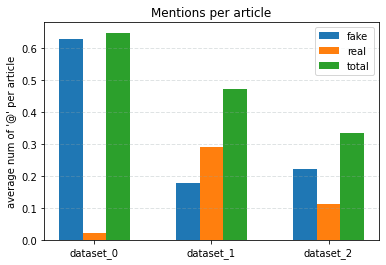

In [10]:
width=0.2
plt.grid(color='#95a5a6', linestyle='--', linewidth=1, axis='y', alpha=0.3);
["fake_len","real_len"]
plt.bar(np.arange(3),[num_of_mention_0[0]/sum(dataset_0_size),num_of_mention_1[0]/sum(dataset_1_size),num_of_mention_2[0]/sum(dataset_2_size)],width=width);
plt.bar(np.arange(3)+width ,[num_of_mention_0[1]/sum(dataset_0_size),num_of_mention_1[1]/sum(dataset_1_size),num_of_mention_2[1]/sum(dataset_2_size)],width=width);
plt.bar(np.arange(3)+2*width ,[sum(num_of_mention_0)/sum(dataset_0_size),sum(num_of_mention_1)/sum(dataset_1_size) ,sum(num_of_mention_2)/sum(dataset_2_size) ],width=width);
plt.title('Mentions per article')
plt.ylabel('average num of \'@\' per article')
plt.legend(["fake","real","total"],loc=1)
plt.xticks(np.arange(3)+0.2,["dataset_0","dataset_1","dataset_2"]);
os.makedirs("img", exist_ok=True);
plt.savefig('img/plot_mention_per_article.png')
plt.show()

Let's check also number of link in each article:

In [11]:
num_of_link_0=[dataset_0_fake.count_occurrences("http://|https://"),dataset_0_real.count_occurrences("http://|https://")];
num_of_link_1=[dataset_1_fake.count_occurrences("http://|https://"),dataset_1_real.count_occurrences("http://|https://")];
num_of_link_2=[dataset_2_fake.count_occurrences("http://|https://"),dataset_2_real.count_occurrences("http://|https://")];

print("Dataset 0: "+str(num_of_link_0[0])+" links for fake articles, "+str(num_of_link_0[1])+" links for real articles (tot: "+str(sum(num_of_link_0))+").");
print("Dataset 1: "+str(num_of_link_1[0])+" links for fake articles, "+str(num_of_link_1[1])+" links for real articles (tot: "+str(sum(num_of_link_1))+").");
print("Dataset 2: "+str(num_of_link_2[0])+" links for fake articles, "+str(num_of_link_2[1])+" links for real articles (tot: "+str(sum(num_of_link_2))+").");

Dataset 0: 3650 links for fake articles, 0 links for real articles (tot: 3650).
Dataset 1: 2308 links for fake articles, 176 links for real articles (tot: 2484).
Dataset 2: 1558 links for fake articles, 22 links for real articles (tot: 1580).


And check for only twitter links:

In [12]:
num_of_tw_link_0=[dataset_0_fake.count_occurrences("https://t.co|https://twitter|www.twitter"),dataset_0_real.count_occurrences("https://t.co|https://twitter|www.twitter")];
num_of_tw_link_1=[dataset_1_fake.count_occurrences("https://t.co|https://twitter|www.twitter"),dataset_1_real.count_occurrences("https://t.co|https://twitter|www.twitter")];
num_of_tw_link_2=[dataset_2_fake.count_occurrences("https://t.co|https://twitter|www.twitter"),dataset_2_real.count_occurrences("https://t.co|https://twitter|www.twitter")];

print("Dataset 0: "+str(num_of_tw_link_0[0])+" twitter links for fake articles, "+str(num_of_tw_link_0[1])+" twitter links for real articles (tot: "+str(sum(num_of_tw_link_0))+").");
print("Dataset 1: "+str(num_of_tw_link_1[0])+" twitter links for fake articles, "+str(num_of_tw_link_1[1])+" twitter links for real articles (tot: "+str(sum(num_of_tw_link_1))+").");
print("Dataset 2: "+str(num_of_tw_link_2[0])+" twitter links for fake articles, "+str(num_of_tw_link_2[1])+" twitter links for real articles (tot: "+str(sum(num_of_tw_link_2))+").");

Dataset 0: 2832 twitter links for fake articles, 0 twitter links for real articles (tot: 2832).
Dataset 1: 594 twitter links for fake articles, 27 twitter links for real articles (tot: 621).
Dataset 2: 75 twitter links for fake articles, 14 twitter links for real articles (tot: 89).


Let's plot results:

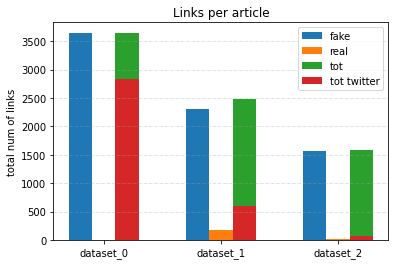

In [13]:
width=0.2
plt.grid(color='#95a5a6', linestyle='--', linewidth=1, axis='y', alpha=0.3);
["fake_len","real_len"]
plt.bar(np.arange(3),[num_of_link_0[0],num_of_link_1[0],num_of_link_2[0]],width=width);
plt.bar(np.arange(3)+width ,[num_of_link_0[1],num_of_link_1[1],num_of_link_2[1]],width=width);
plt.bar(np.arange(3)+2*width ,[sum(num_of_link_0),sum(num_of_link_1) ,sum(num_of_link_2) ],width=width);
plt.bar(np.arange(3)+2*width,[num_of_tw_link_0[0],num_of_tw_link_1[0],num_of_tw_link_2[0]],width=width);
plt.title('Links per article')
plt.ylabel('total num of links')
plt.legend(["fake","real","tot","tot twitter"],loc=1)
plt.xticks(np.arange(3)+0.2,["dataset_0","dataset_1","dataset_2"]);
os.makedirs("img", exist_ok=True);
plt.savefig('img/plot_link_per_article.png')
plt.show()

Now let's check which are the most common words for each dataset. First of all we need to clean data and remove stop words:

In [14]:
dataset_0_fake=dataset_0_fake.clean().lemmatize().remove_numbers().remove_stop_words();
dataset_0_real=dataset_0_real.clean().lemmatize().remove_numbers().remove_stop_words();

dataset_1_fake=dataset_1_fake.clean().lemmatize().remove_numbers().remove_stop_words();
dataset_1_real=dataset_1_real.clean().lemmatize().remove_numbers().remove_stop_words();

dataset_2_fake=dataset_2_fake.clean().lemmatize().remove_numbers().remove_stop_words();
dataset_2_real=dataset_2_real.clean().lemmatize().remove_numbers().remove_stop_words();

Now let's plot the word cloud for each dataset (divided by categories)!

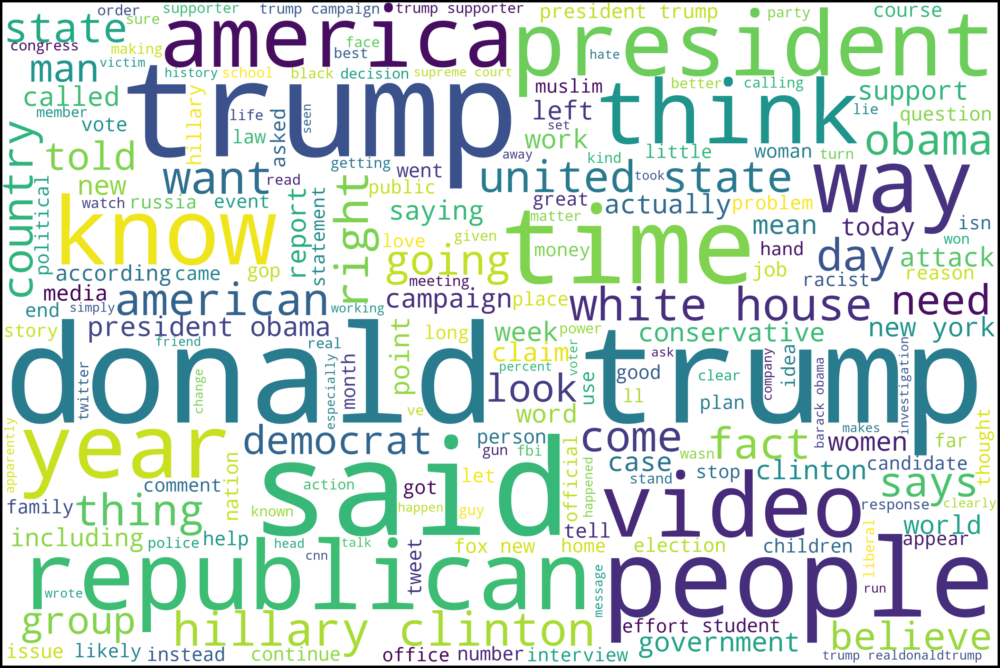

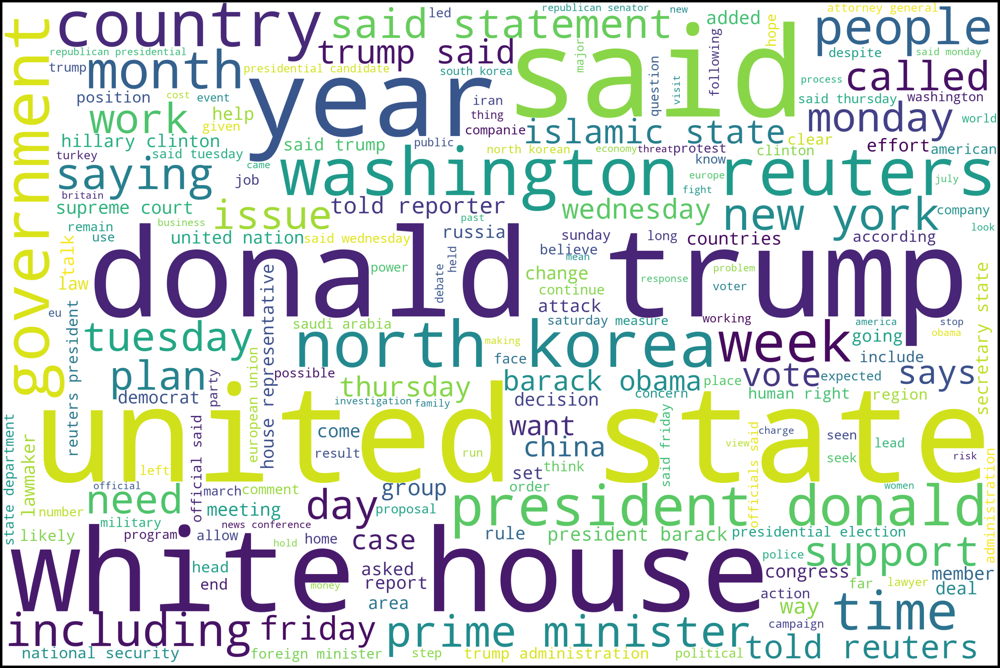

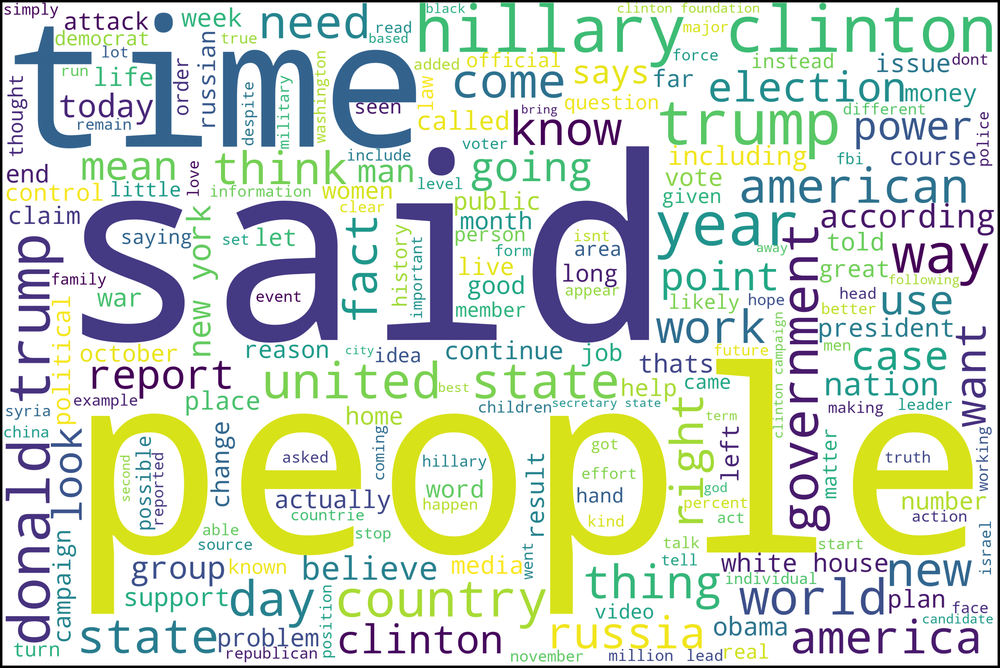

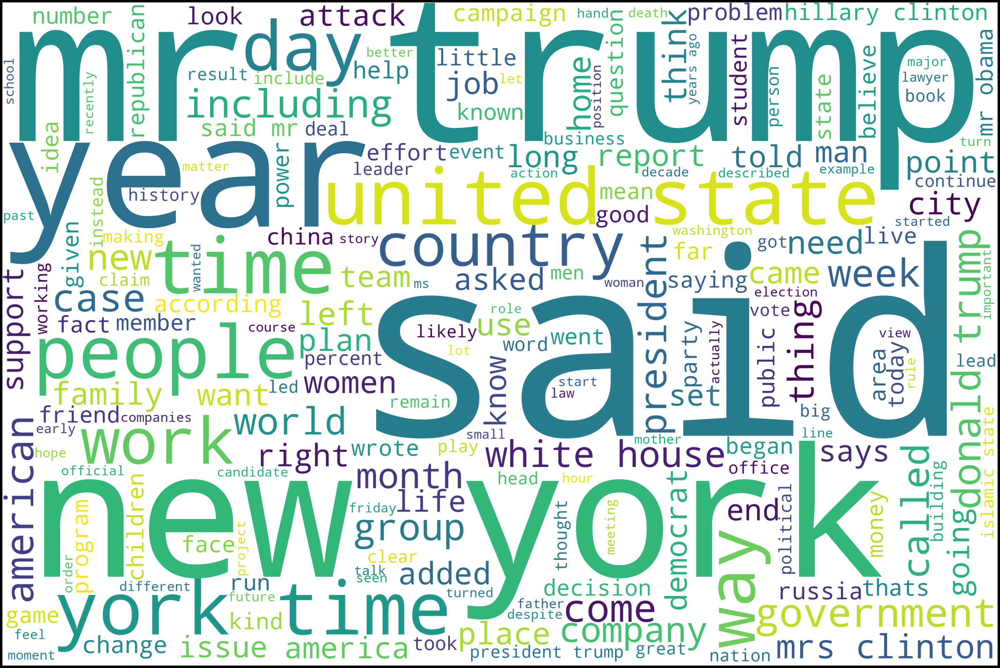

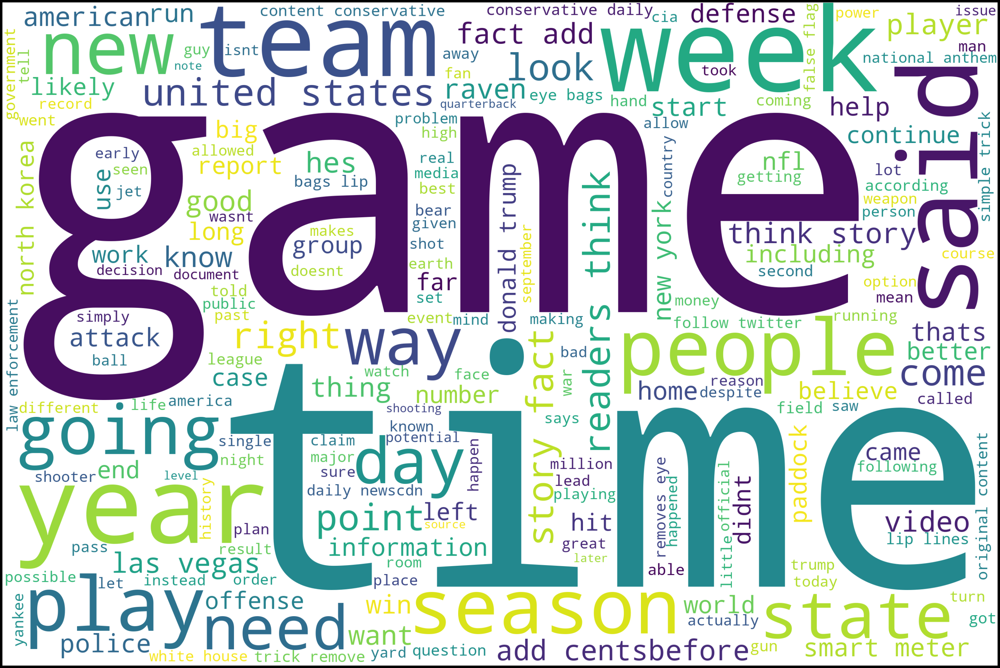

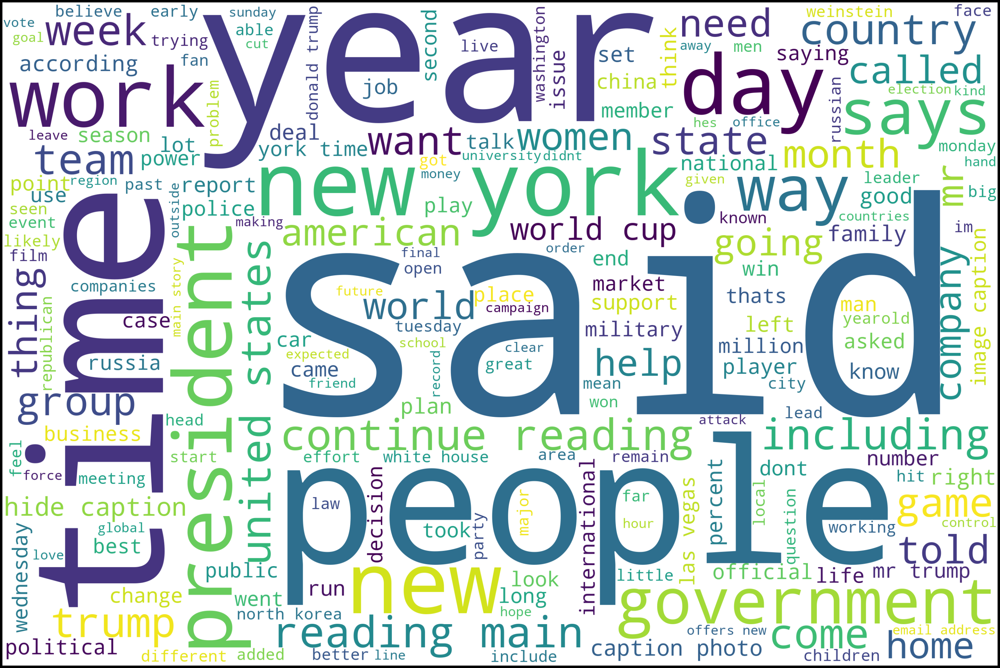

In [15]:
os.makedirs("img", exist_ok=True);

dataset_0_fake.word_cloud("img/fig_word_cloud_fake_0");
dataset_0_real.word_cloud("img/fig_word_cloud_real_0");

dataset_1_fake.word_cloud("img/fig_word_cloud_fake_1");
dataset_1_real.word_cloud("img/fig_word_cloud_real_1");

dataset_2_fake.word_cloud("img/fig_word_cloud_fake_2");
dataset_2_real.word_cloud("img/fig_word_cloud_real_2");


Find, among the top 100 most frequent words for real and fake news articles, which are the ones with most unbalanced occurrences:

In [16]:
from collections import defaultdict

fake_news = Dataset(0).clean().lemmatize().remove_numbers().remove_stop_words().get().query("label==1")["text"];
real_art = Dataset(0).clean().lemmatize().remove_numbers().remove_stop_words().get().query("label==0")["text"];

dataset_0_fake=Dataset(0).drop_empty_rows().filter(only_fake=True).clean().lemmatize().remove_numbers().remove_stop_words();
dataset_0_real=Dataset(0).drop_empty_rows().filter(only_real=True).clean().lemmatize().remove_numbers().remove_stop_words();

temp = defaultdict(int)
temp2 = defaultdict(int)
 
for sub in fake_news:
    for wrd in sub.split():
        temp[wrd] += 1
 
for sub in real_art:
    for wrd in sub.split():
        temp2[wrd] += 1
 

sorted_values_fake = sorted(temp,key=temp.get, reverse=True);
sorted_values_real = sorted(temp2,key=temp2.get, reverse=True);
result=sorted_values_fake[0:100]+sorted_values_real[0:100]


freq = list();
for   word in result:
    occ = dataset_0_fake.count_occurrences(word)/(dataset_0_fake.count_occurrences(word)+dataset_0_real.count_occurrences(word));
    freq.append(occ);

freq1= [ [result,freq] for   result,freq in sorted(zip(freq, result))]
freq2= [ [result,freq] for   result,freq in sorted(zip(freq, result),reverse=True)]

print("Top 20 words that appear much more in real articles instead of trustworthy ones:")
print(freq1[0:20])
print("Top 20 words that appear much more in real articles instead of trustworthy ones:")
print(freq2[0:20])


Top 5 words that appear much more in real articles instead of trustworthy ones:
[[0.01095805709182096, 'reuters'], [0.07341040462427746, 'talks'], [0.07586269855760452, 'minister'], [0.09355723764861551, 'eu'], [0.09716981132075472, 'china'], [0.09782426778242678, 'korea'], [0.09979757085020242, 'sanctions'], [0.10409202338299076, 'spokesman'], [0.11918452692106639, 'trade'], [0.12421037688977216, 'trumps'], [0.15407798078734225, 'north'], [0.16157436876723955, 'wednesday'], [0.1738141650422352, 'thursday'], [0.18165592464055527, 'tuesday'], [0.18945284886186908, 'nuclear'], [0.1938534278959811, 'iran'], [0.19756596906278434, 'monday'], [0.19922234728333163, 'south'], [0.19965031144137252, 'friday'], [0.20340996948118006, 'said']]
Top 5 words that appear much more in real articles instead of trustworthy ones:
[[0.9763811048839072, 'gop'], [0.9543357625192218, 'image'], [0.9491094147582697, 'images'], [0.9418049556717436, 'realdonaldtrump'], [0.9169886834115374, 'video'], [0.88360008314

Checking occurrences of some of these words:

In [17]:
said_occ_0=[dataset_0_fake.count_occurrences("said"),dataset_0_real.count_occurrences("said")];
said_occ_1=[dataset_1_fake.count_occurrences("said"),dataset_1_real.count_occurrences("said")];
said_occ_2=[dataset_2_fake.count_occurrences("said"),dataset_2_real.count_occurrences("said")];

reuters_occ_0=[dataset_0_fake.count_occurrences("reuters"),dataset_0_real.count_occurrences("reuters")];
reuters_occ_1=[dataset_1_fake.count_occurrences("reuters"),dataset_1_real.count_occurrences("reuters")];
reuters_occ_2=[dataset_2_fake.count_occurrences("reuters"),dataset_2_real.count_occurrences("reuters")];

eu_occ_0=[dataset_0_fake.count_occurrences("eu"),dataset_0_real.count_occurrences("eu")];
eu_occ_1=[dataset_1_fake.count_occurrences("eu"),dataset_1_real.count_occurrences("eu")];
eu_occ_2=[dataset_2_fake.count_occurrences("eu"),dataset_2_real.count_occurrences("eu")];

image_occ_0=[dataset_0_fake.count_occurrences("image"),dataset_0_real.count_occurrences("image")];
image_occ_1=[dataset_1_fake.count_occurrences("image"),dataset_1_real.count_occurrences("image")];
image_occ_2=[dataset_2_fake.count_occurrences("image"),dataset_2_real.count_occurrences("image")];

print ("Occurrences of \"reuters\" for dataset 0 in fake articles:"+str(reuters_occ_0[0]))
print ("Occurrences of \"reuters\" for dataset 0 in true articles:"+str(reuters_occ_0[1]))
print ("Occurrences of \"reuters\" for dataset 1 in fake articles:"+str(reuters_occ_1[0]))
print ("Occurrences of \"reuters\" for dataset 1 in true articles:"+str(reuters_occ_1[1]))
print ("Occurrences of \"reuters\" for dataset 2 in fake articles:"+str(reuters_occ_2[0]))
print ("Occurrences of \"reuters\" for dataset 2 in true articles:"+str(reuters_occ_2[1]))

 

Occurrences of "reuters" for dataset 0 in fake articles:319
Occurrences of "reuters" for dataset 0 in true articles:28792
Occurrences of "reuters" for dataset 1 in fake articles:527
Occurrences of "reuters" for dataset 1 in true articles:350
Occurrences of "reuters" for dataset 2 in fake articles:36
Occurrences of "reuters" for dataset 2 in true articles:1532


## ❍ Lstm models: training
<hr>
This chapter cover the training phase of the two Lstm model (section 4 of the report)
<hr>

First of all let's just get the full dataset that will be used for training:

In [18]:
dataset=Dataset(0).clean().remove_stop_words().lemmatize().get();

Let's divide dataset in 80% for training our models and 20% for  test. If this division have already been performed (i.e. train.csv and eval.csv are already present in the data folder), then keep the older (in order to use always same division if model have to be re-trained):

In [19]:
#Store divided datasets
if not(os.path.exists("data/train.csv")):
    train_dataset=dataset.sample(frac=0.8,random_state=1)  
    eval_dataset=dataset.drop(train_dataset.index)
    os.makedirs("data", exist_ok=True);
    train_dataset.to_csv('data/train.csv');
    eval_dataset.to_csv('data/eval.csv');
#Read csv files:
train_dataset=pd.read_csv('data/train.csv',index_col =1).dropna();
eval_dataset=pd.read_csv('data/eval.csv',index_col =1).dropna();

Now save images of the 2 model structures and get vocabularies size:

In [20]:
model_1=Lstm(train=train_dataset, test=eval_dataset).prepare().build();
model_2=LstmWord2Vec(train=train_dataset, test=eval_dataset).prepare().build();

os.makedirs("img", exist_ok=True);
model_1.save_model("img/fig_emb_lstm_model.png");
model_2.save_model("img/fig_emb_lstm_word2vec_model.png");

print("Lstm network vocabulary size: "+str(model_1.get_vocab_size()));
print("Lstm with Word2Vec network vocabulary size: "+ str(model_2.get_vocab_size()));

Lstm network vocabulary size: 218678
Lstm with Word2Vec network vocabulary size: 218678


Finally let's train these models (unless they are not already present in the models folder: if you want to re-train the models, just delete models folder):

In [21]:
model_1=Lstm( train=train_dataset, test=eval_dataset ).prepare().build();

if os.path.exists("models/model_1"):
    model_1.model=keras.models.load_model('models/model_1')
if not(os.path.exists("models/model_1")):
    model_1.train_model();
    model_1.model.save('models/model_1')
    model_1.plot_metrics();


In [22]:
model_2=LstmWord2Vec( train=train_dataset, test=eval_dataset ).prepare().build();

if os.path.exists("models/model_2"):
    model_2.model=keras.models.load_model('models/model_2')
if not(os.path.exists("models/model_2")):
    model_2.train_model();
    model_2.model.save('models/model_2')
    model_2.plot_metrics();

## ❍ Models evaluation 
<hr>
Now the 2 Lstm trained models and the fine tuned Bert model are evaluated on dataset 1 and 2. Accuracy, Recall, Precision and f1 are computed for each case. In addition, with the aim of providing more information on how models perform differently from each other, the McNemar statistical test have been used.
<hr>

Let's get the 2 datasets again:

In [23]:
dataset_1=Dataset(1).clean().remove_stop_words().lemmatize().get();
dataset_2=Dataset(2).clean().remove_stop_words().lemmatize().get();
 

And get predictions for the 2 Lstm models:

In [24]:
model_lstm_predictions_dataset_1=[round(el[0]) for el in model_1.eval(dataset_1)];
model_lstm_predictions_dataset_2=[round(el[0]) for el in model_1.eval(dataset_2)];
model_lstm_w2v_predictions_dataset_1=[round(el[0]) for el in model_2.eval(dataset_1)];
model_lstm_w2v_predictions_dataset_2=[round(el[0]) for el in model_2.eval(dataset_2)];



90/90 [==============================] - 22s 248ms/step


Now import the already fine tuned Bert model using the RobertaFineModel class:

In [25]:
model_3 = RobertaFineModel();

Let's get the two dataset again, without concatenate body and title:

In [26]:
dataset_1=Dataset(1,concat_title=False).clean().remove_stop_words().lemmatize().get();
dataset_2=Dataset(2,concat_title=False).clean().remove_stop_words().lemmatize().get();

Now the Bert model is evaluated for dataset 1. If the prediction_dataset_1.csv file is found in the bert folder, then evaluation is skipped since results are already present in that file. This have been done in order to run the notebook quite fast while looking at the results. In fact, getting the predictions for dataset 2 have required 567 min ... )

In [27]:
model_bert_predictions_dataset_1=list()
real=[int(i) for i in dataset_1["label"]];
if not(os.path.exists("train_result/bert/prediction_dataset_1.csv")):
    os.makedirs("train_result", exist_ok=True);
    os.makedirs("train_result/bert", exist_ok=True);
    for index in  range(dataset_1.shape[0]):
        model_bert_predictions_dataset_1.append(model_3.predict_article(dataset_1.iloc[index]['title'],dataset_1.iloc[index]['text']))
    pd.DataFrame(model_bert_predictions_dataset_1,columns=["prediction"]).to_csv("train_result/bert/prediction_dataset_1.csv");
 
#Read csv files:
model_bert_predictions_dataset_1=list(pd.read_csv('train_result/bert/prediction_dataset_1.csv',index_col =0).dropna()["prediction"]);

Now the Bert model is evaluated for dataset 2. If the prediction_dataset_2.csv file is found in the bert folder, then evaluation is skipped since results are already present in that file. This have been done in order to run the notebook quite fast while looking at the results. In fact, getting the predictions for dataset 2 have required 55 min ... )

In [28]:
model_bert_predictions_dataset_2=list()
real=[int(i) for i in dataset_2["label"]];
if not(os.path.exists("train_result/bert/prediction_dataset_2.csv")):
    os.makedirs("train_result", exist_ok=True);
    os.makedirs("train_result/bert", exist_ok=True);
    for index in  range(dataset_2.shape[0]):
        model_bert_predictions_dataset_2.append(model_3.predict_article(dataset_2.iloc[index]['title'],dataset_2.iloc[index]['text']))
    pd.DataFrame(model_bert_predictions_dataset_2,columns=["prediction"]).to_csv("train_result/bert/prediction_dataset_2.csv");
 
#Read csv files:
model_bert_predictions_dataset_2=list(pd.read_csv('train_result/bert/prediction_dataset_2.csv',index_col =0).dropna()["prediction"]);
 

Now we have obtained all the predictions. Let's define the function that will be used to compute all the metrics:

In [29]:
 
def from_res_to_metrics (predictions,real):
    true_positive,true_negative,false_positive,false_negative=0,0,0,0;
    for i,pred in enumerate(predictions):
        if (predictions[i]==1 and real[i]==1):
            true_positive+=1;
        elif (predictions[i]==0 and real[i]==0):
            true_negative+=1;
        elif (predictions[i]==1 and real[i]==0):
            false_positive+=1;
        else:
            false_negative+=1;
            
    stat = {};
    stat["accuracy"]=(true_positive+true_negative)/(len(predictions));
    stat["precision"]=true_positive/(true_positive+false_positive);
    stat["recall"]=true_positive/(true_positive+false_negative);
    stat["f1"]=2*(stat["precision"]*stat["recall"])/(stat["precision"]+stat["recall"]) if (stat["precision"]+stat["recall"])!=0 else None;
    return stat;


And now compute metrics for all the predictions:

In [30]:
stat_lstm_dataset1=from_res_to_metrics(model_lstm_predictions_dataset_1,list(dataset_1["label"]))
stat_lstm_dataset2=from_res_to_metrics(model_lstm_predictions_dataset_2,list(dataset_2["label"]))

stat_lstm_w2v_dataset1=from_res_to_metrics(model_lstm_w2v_predictions_dataset_1,list(dataset_1["label"]))
stat_lstm_w2v_dataset2=from_res_to_metrics(model_lstm_w2v_predictions_dataset_2,list(dataset_2["label"]))

stat_bert_dataset1=from_res_to_metrics(model_bert_predictions_dataset_1,list(dataset_1["label"]))
stat_bert_dataset2=from_res_to_metrics(model_bert_predictions_dataset_2,list(dataset_2["label"]))

print ("Example: metrics of first Lstm model on dataset 1 predictions:");
print (stat_lstm_dataset1);

Example: metrics of first Lstm model on dataset 1 predictions:
{'accuracy': 0.5581001532134505, 'precision': 0.5403491200457863, 'recall': 0.6248345466578424, 'f1': 0.5795288882068595}


Finally let's apply the McNemar test to all pairs of results:

In [31]:
def mcnemar_test(y,t1,t2):
    a = sum(np.logical_and((t1 == y),(t2 == y)))
    b = sum(np.logical_and((t1 != y),(t2 == y)))
    c = sum(np.logical_and((t1 == y),(t2 != y)))
    d = sum(np.logical_and((t1 != y),(t2 != y)))
    table = [[a, b],[c, d]];
    return mcnemar(table,exact=True).pvalue;

In [32]:
#We call model_1 -> lstm, model_2 -> lstm with w2v, model_3 -> bert

p_value_model_1_model_2_dataset_1=mcnemar_test(dataset_1["label"],model_lstm_predictions_dataset_1,model_lstm_w2v_predictions_dataset_1)
p_value_model_1_model_3_dataset_1=mcnemar_test(dataset_1["label"],model_lstm_predictions_dataset_1,model_bert_predictions_dataset_1)
p_value_model_2_model_3_dataset_1=mcnemar_test(dataset_1["label"],model_lstm_w2v_predictions_dataset_1,model_bert_predictions_dataset_1)

p_value_model_1_model_2_dataset_2=mcnemar_test(dataset_2["label"],model_lstm_predictions_dataset_2,model_lstm_w2v_predictions_dataset_2)
p_value_model_1_model_3_dataset_2=mcnemar_test(dataset_2["label"],model_lstm_predictions_dataset_2,model_bert_predictions_dataset_2)
p_value_model_2_model_3_dataset_2=mcnemar_test(dataset_2["label"],model_lstm_w2v_predictions_dataset_2,model_bert_predictions_dataset_2)

print("Example: p-value for McNemar test between model Lstm+W2v and Bert on dataset 1: " +str(p_value_model_2_model_3_dataset_1));

Example: p-value for McNemar test between model Lstm+W2v and Bert on dataset 1: 0.00018148837529499974


## ❍ Extraordinary classifiers
<hr>
Given the results of the dataset analyses and the results of the model evaluations, we want to reveal the problem of training set by training 3 extremely simple models with exceptional performances.
<hr>

Let's get the same training set and test set used before:

In [33]:
#get training set and test set again:
if not(os.path.exists("data/train.csv")):
    train_dataset=dataset.sample(frac=0.8,random_state=1)  
    eval_dataset=dataset.drop(train_dataset.index)
    os.makedirs("data", exist_ok=True);
    train_dataset.to_csv('data/train.csv');
    eval_dataset.to_csv('data/eval.csv');
#Read csv files:
train_dataset=pd.read_csv('data/train.csv',index_col =1).dropna();
eval_dataset=pd.read_csv('data/eval.csv',index_col =1).dropna();

Now let's add to the datasets the occurrences of the 4 unbalanced words previously found:

In [34]:
train_dataset["said"]=[text.count("said") for text in train_dataset["text"]];
train_dataset["eu"]=[text.count("eu") for text in train_dataset["text"]];
train_dataset["reuters"]=[text.count("reuters") for text in train_dataset["text"]];
train_dataset["image"]=[text.count("image") for text in train_dataset["text"]];

eval_dataset["said"]=[text.count("said") for text in eval_dataset["text"]];
eval_dataset["eu"]=[text.count("eu") for text in eval_dataset["text"]];
eval_dataset["reuters"]=[text.count("reuters") for text in eval_dataset["text"]];
eval_dataset["image"]=[text.count("image") for text in eval_dataset["text"]];

Let's just train a simple SVM model:

In [35]:
from sklearn import svm
 
feature_1 = ["said","eu","image"];
feature_2 = ["said","eu"];
feature_3 = ["reuters"];

feature = feature_1;

X=train_dataset[feature].values.tolist()
y=list(train_dataset["label"])
clf = svm.LinearSVC();
clf.fit(X, y)


c:\Python310\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


LinearSVC()

In [36]:
def from_res_to_metrics (predictions,real):
    true_positive,true_negative,false_positive,false_negative=0,0,0,0;
    for i,pred in enumerate(predictions):
        if (predictions[i]==1 and real[i]==1):
            true_positive+=1;
        elif (predictions[i]==0 and real[i]==0):
            true_negative+=1;
        elif (predictions[i]==1 and real[i]==0):
            false_positive+=1;
        else:
            false_negative+=1;
            
    stat = {};
    stat["accuracy"]=(true_positive+true_negative)/(len(predictions));
    stat["precision"]=true_positive/(true_positive+false_positive) if (true_positive+false_positive)!=0 else None;
    stat["recall"]=true_positive/(true_positive+false_negative);
    stat["f1"]=2*(stat["precision"]*stat["recall"])/(stat["precision"]+stat["recall"]) if stat["precision"] is not None and (stat["precision"]+stat["recall"])!=0 else None;
    return stat;

And finally test the SVM model on the test set:

In [37]:
X_test=eval_dataset[feature].values.tolist()
y_test=list(eval_dataset["label"])
predictions= clf.predict(X_test);
print(from_res_to_metrics(predictions,y_test))

{'accuracy': 0.9355590062111802, 'precision': 0.9841680129240711, 'recall': 0.8715307582260372, 'f1': 0.9244309559939302}
